<a href="https://colab.research.google.com/github/zelal-Eizaldeen/deeplearning_course_from_perceptron_to_llm/blob/main/3_8AvoidingSaturatedNeuronsP2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- We will now continue looking at saturated neurons and vanishing gradients. In the last video, we discussed three mitigation techniques for saturated neurons and vanishing gradients. We will now look at two more techniques.

#Cross-entropy loss function

 We'll start with a cross-entropy loss function. Let's now look at the output layer in detail. If we are not careful, we can get these neurons to enter the saturation region. Let's assume that we're working with a sigmoid neuron. We're building a classifier, that is, we are training this output neuron to output either zero or one, that is, we are training this neuron to enter the saturation region. To gain some insights here, we need to look at the interaction between the output neuron, the loss function, and the backpropagation algorithm.

The backward pass starts with a derivative of the loss function. If we use the mean squared error loss function, the derivative is the negative difference between the truth and the output.

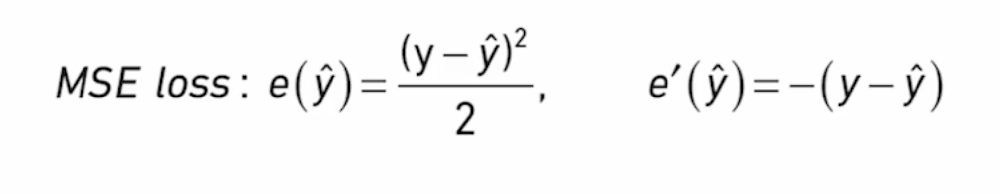

We then compute the derivative of the logistic sigmoid function, which is S times one minus S.

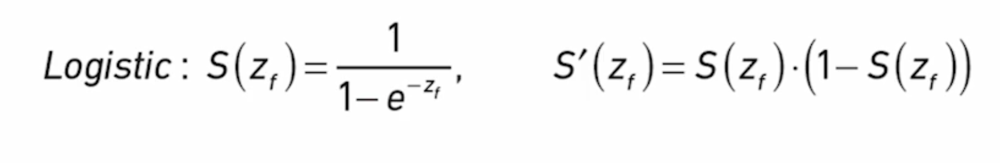

We then multiply both of these together. In this formula, I have not expanded the derivative of S, but simply called it S prime.

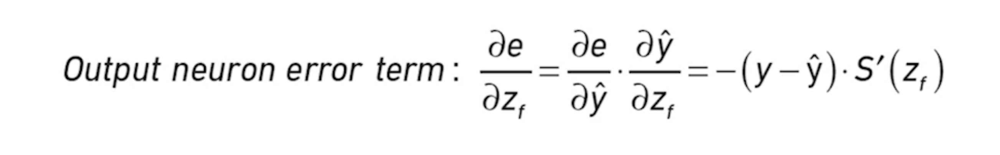

Let's now look at the details by plotting these values for different result values. This chart shows three curves.

The blue one is the derivative of the mean squared error loss function, the orange one is the derivative of the sigmoid activation function, and the green is the product of these two derivatives. The chart visualizes the change of these values based on how far the network's output is from the desired output, and we assume that the desired output is zero for this example. That is, on the left side, the network output matches the ground truth, and the neuron is in one of its saturation regions.

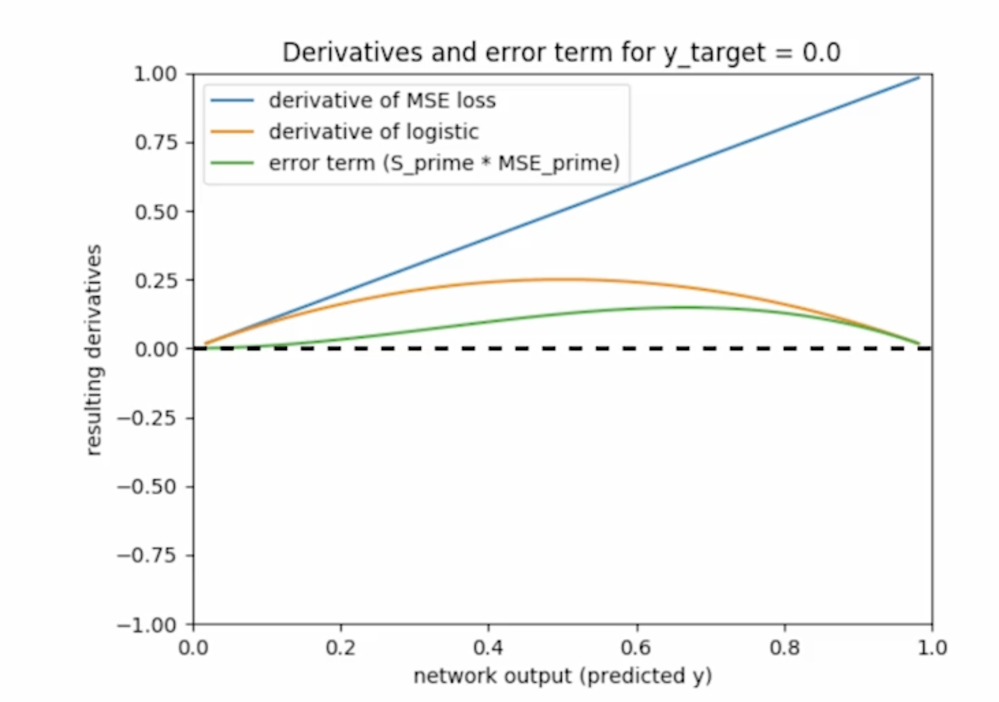

On the right side, the network output is 1.0, which is opposite of the ground truth, the opposite of the desired value, and the neuron is in its other saturation region.

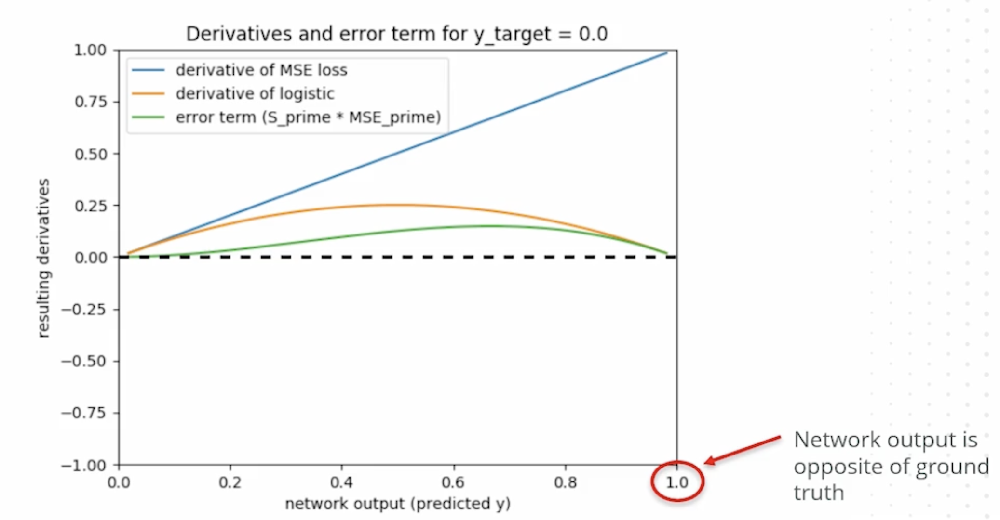

 Now let's look at the three curves between these two points. So we start with the blue curve, which is the derivative of the mean squared error loss function. On the left end of the chart, this derivative is zero. We start backpropagation with a derivative of the MSE loss function. In this case, we will inject zero backwards to the network, which will not adjust any weights. However, that is not a problem, given that the output is already producing the desired value.

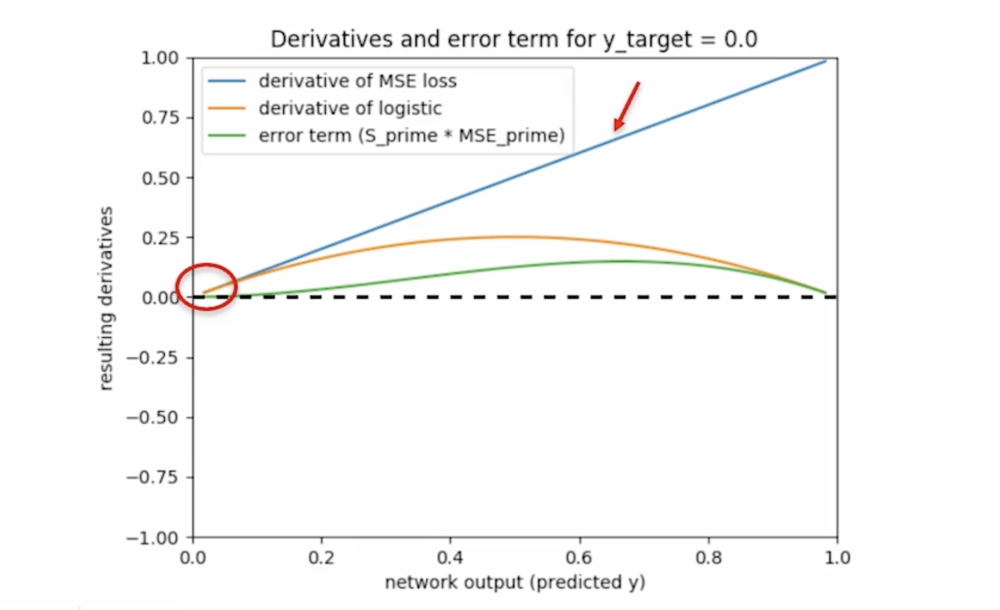

 Moving the right end of the chart, we see that this derivative is 1.0. We will inject this non-zero, or this 1.0 value, in backward to the network in the backpropagation algorithm. This will potentially adjust the weights to get the desired behavior, so everything seems good at this point.

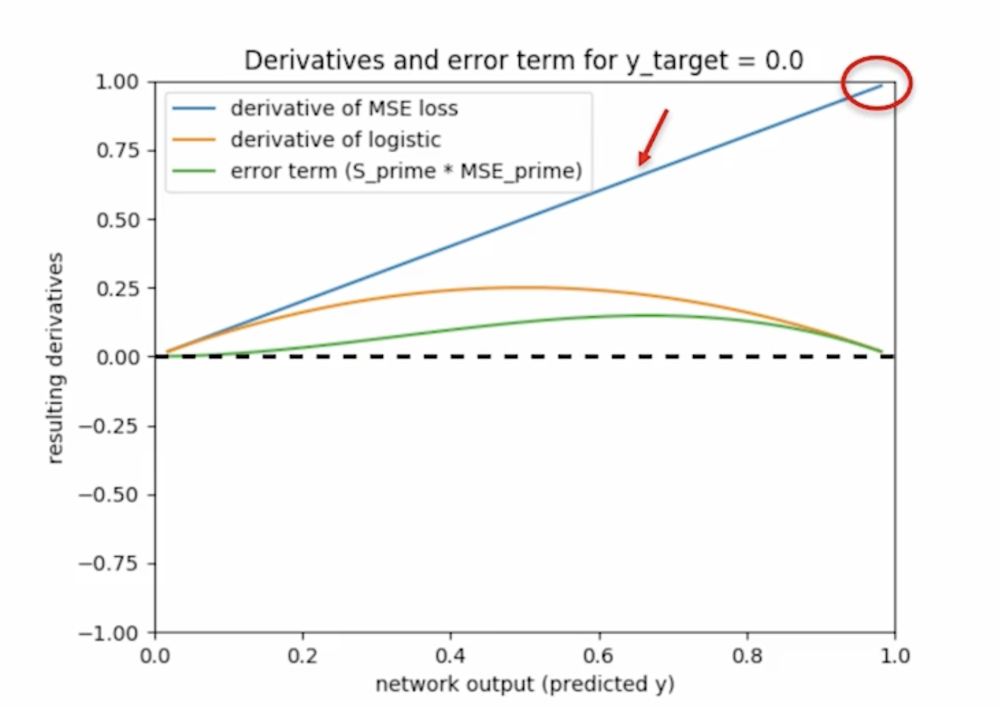

Now let's look at the orange curve, which is the derivative of the sigmoid function. On the left side, this derivative is zero.

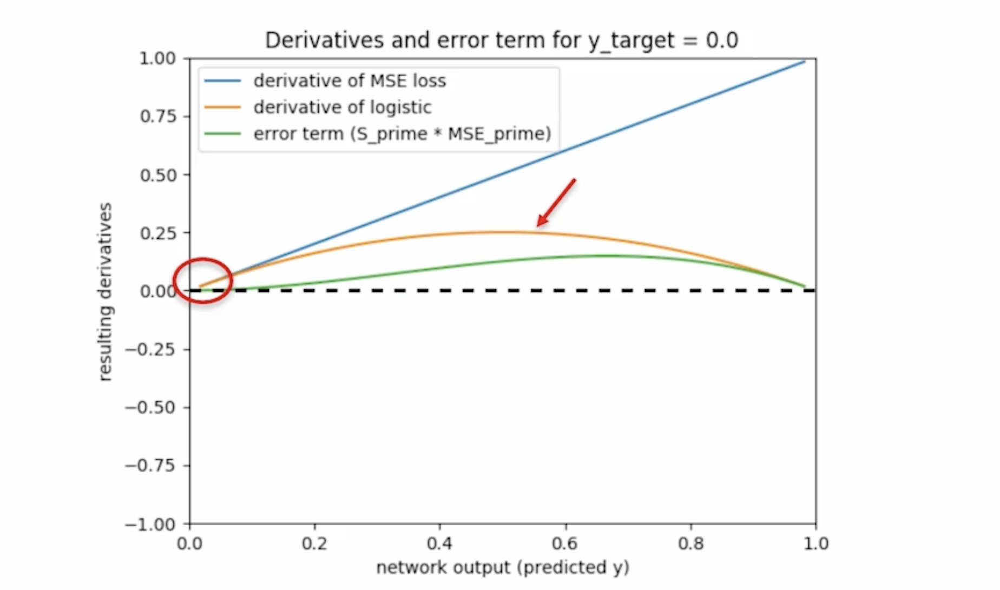

That is not a problem. As we move right, the derivative increases as the output diverges from the desired value.

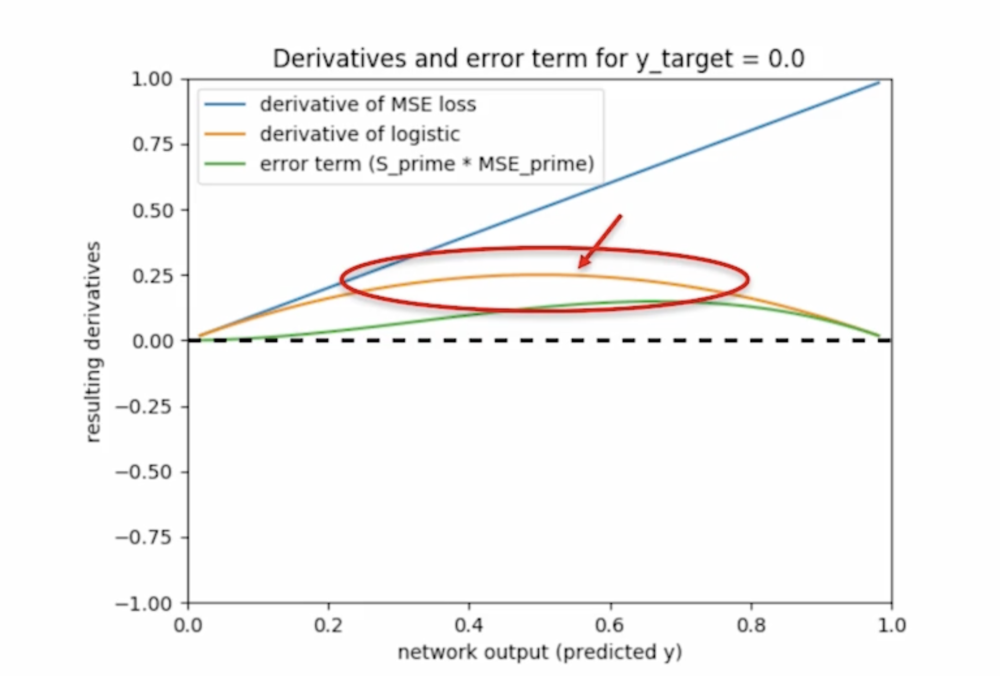

However, when we then go to the very far right, we see that this derivative approaches zero.

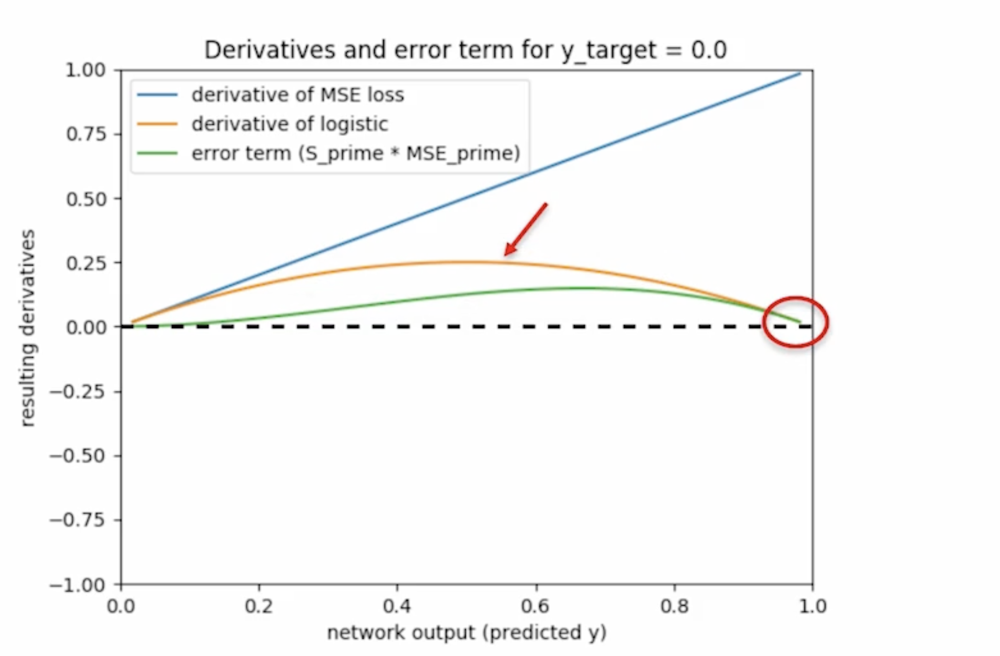

Let's now see how this affects the green curve, which is the error term for the output neuron. We get the green curve by multiplying the derivative of the loss function by the derivative of the activation function.

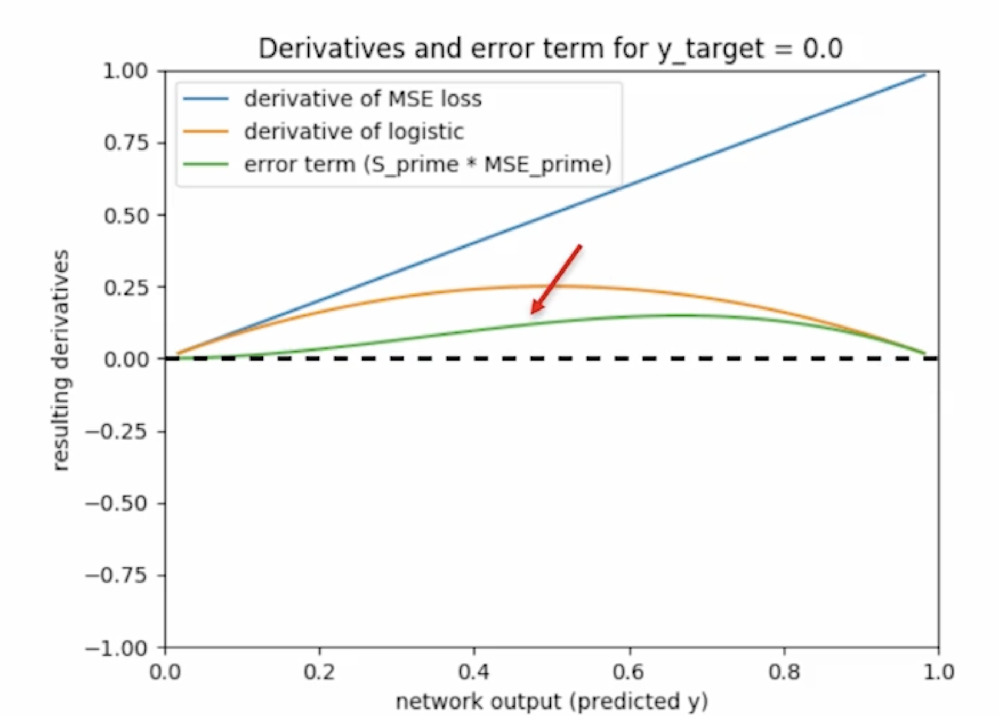

We see that, moderately far from the desired value, we have a non-zero error term. This will propagate backward and can adjust the weights.

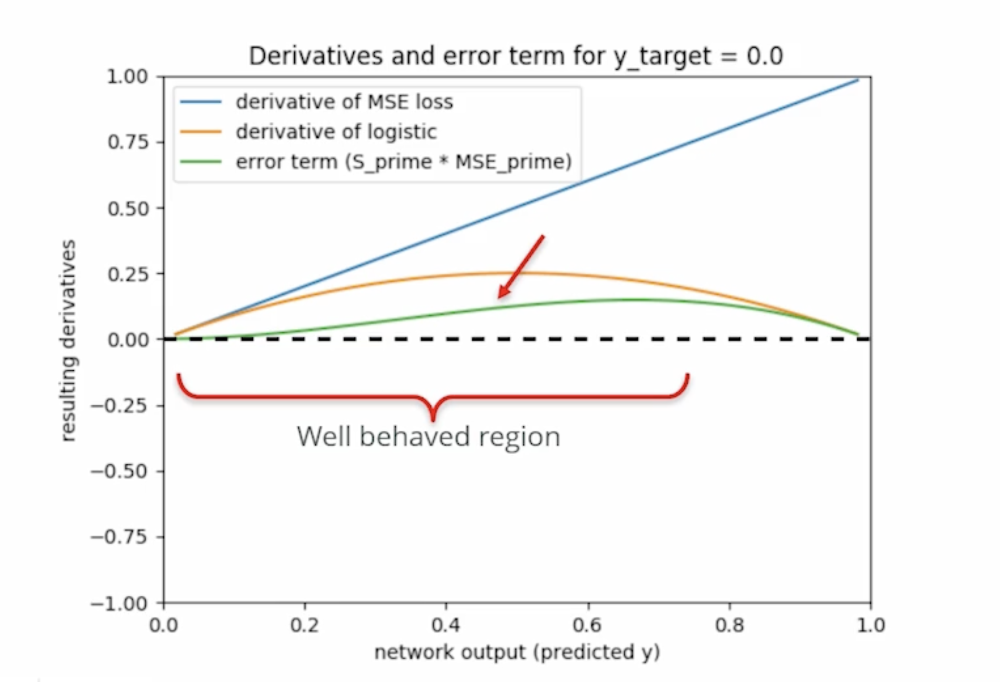

However, if the output is close to 1.0, which is opposite of the desired value, we see that this green curve, which is the error term for the output neuron, is zero. No error will propagate backwards, and no weights will be adjusted. The network will not learn. This is a big problem, and a solution to this is to consider using a different loss function. We will explore that on the next slide.

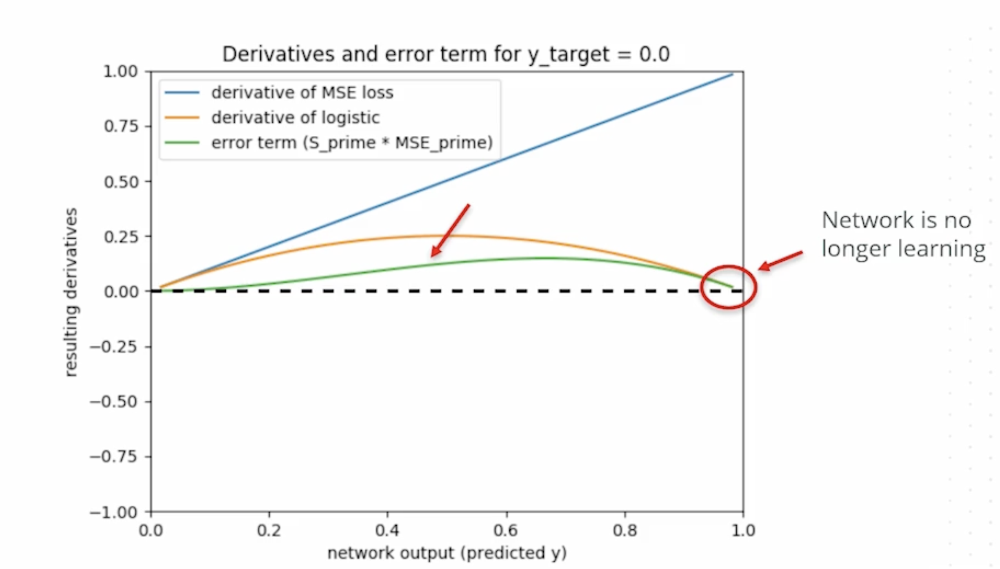

On this slide, we will introduce the **cross-entropy loss** function that can be used instead of the mean squared error. The formula is shown here.

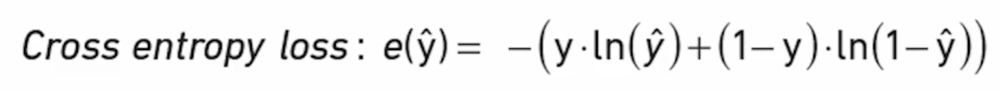

 The chart shows how the derivative of the cross-entropy loss function behaves as a function of the network output. We saw on the previous slide that, for the derivative of mean squared error, it approached 1.0 as the output approached 1.0.


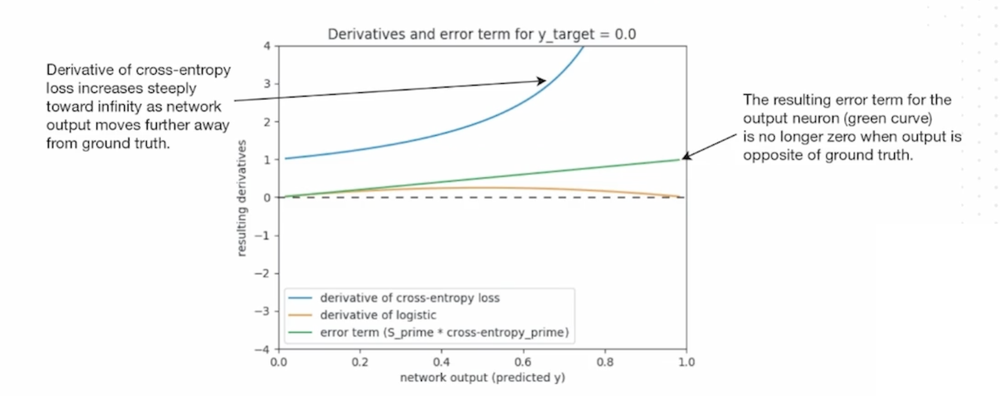

The derivative of the cross-entropy loss function will approach infinity as the output approaches 1.0.

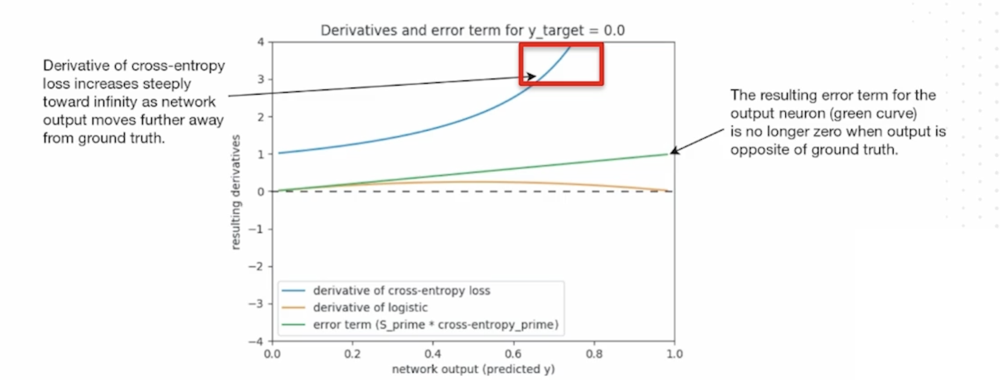

We see that from the blue curve moving steeply and going outside of the chart as we move right. Let's now see how this affects the green curve.

We know that, as we approach 1.0, the sigmoid neuron derivative will approach zero.That's the orange curve. When we now multiply that by the derivative of the cross-entropy loss function, which approaches infinity, the product will approach 1.0.

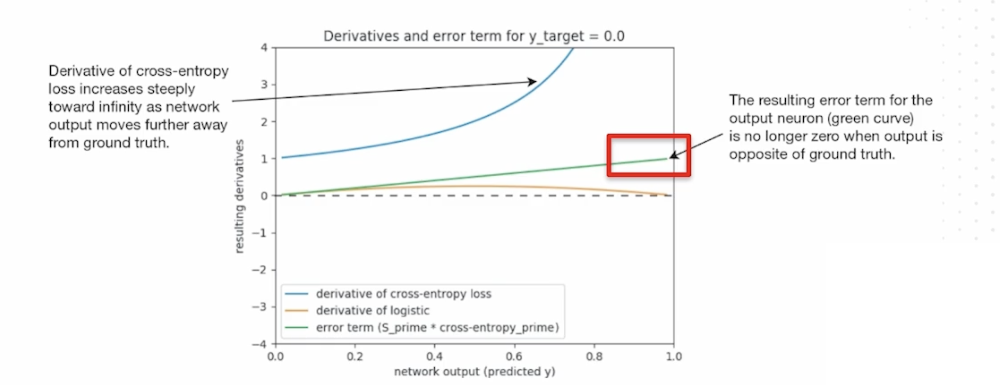

That is, if the output neuron is opposite to the desired value, we will still have a non-zero error for the output neuron, and this will enable us to adjust the weights, and the network to continue to learn.



 The chart compares the two loss functions, and we can see that they're actually not all that different. We see how the loss functions change as the network output is moving further away from the desired output of zero. At the left side of the chart, where the network output matches the desired output, both loss functions are zero. As the network output moves further away from the desired value, both loss functions increase. The only difference is that the cross-entropy loss function increases faster than the mean squared error loss function, and as we saw on the previous slide, this will counteract the problem with a saturated output neuron. Therefore, the cross-entropy loss function is a better choice to use when you use sigmoid neurons in the output layer.

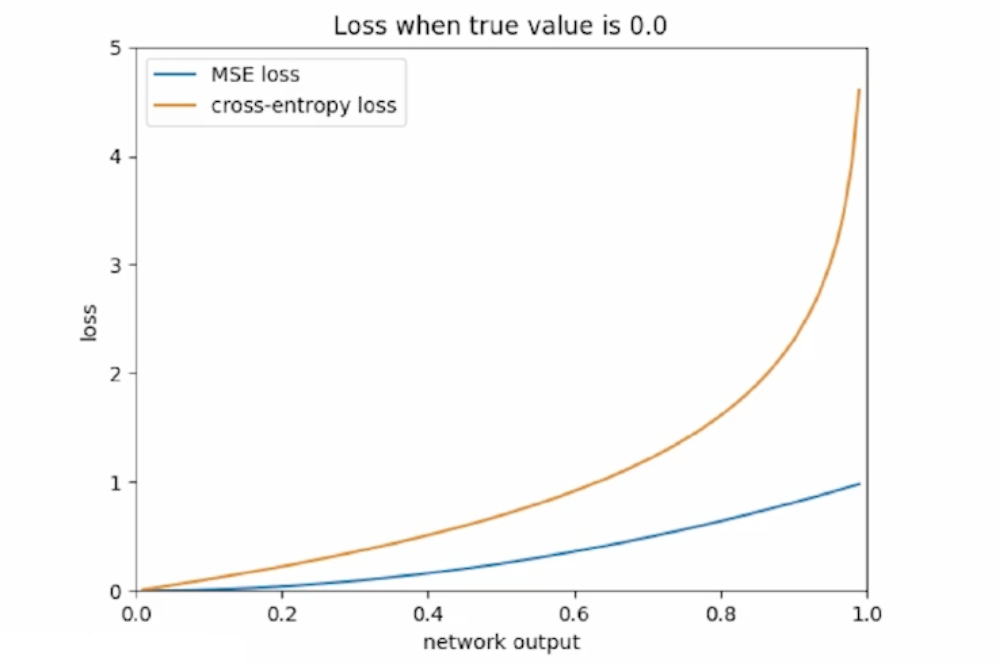

# Prgrammatic Implementation of cross-entropy loss function
Looking at the function, we see that it consists of two terms where each term is a product.

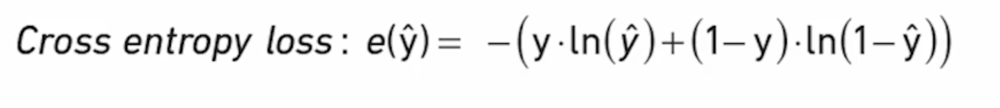

The first term has y as its first factor, and the second term has 1-y as its first factor, y is here the desired output of the network, which is either zero or one. This means that in all cases, either Y or one minus Y will be zero. In other words, Y and one minus Y will act as an if statement. It will select either the term negative lny_hat or the term negative ln(1-y_hat).

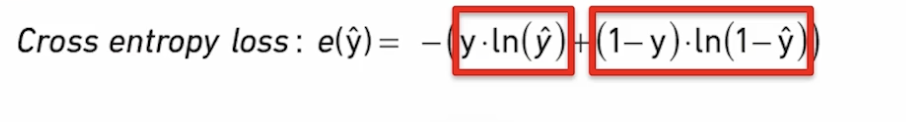

The typical code implementation is shown on this cell. This was a lot of information about the cross-entropy loss function. However, as a DL practitioner, the only thing you need to remember is to use the cross-entropy loss function when you use a **sigmoid neuron for your output layer for a classification task**. The deep learning framework will handle the details for you.

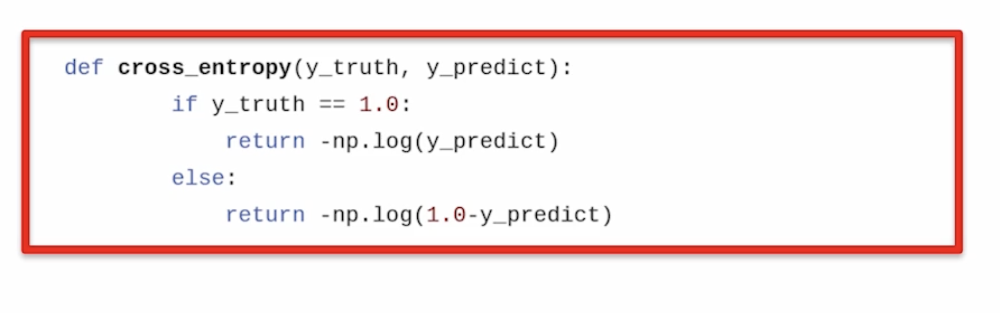

We have now looked at the number of techniques to avoid saturation when we work with sigmoid and tanh neurons.

 Another alternative is to use a different activation function that avoids saturation altogether. Starting at the upper left, we see our tanh function that we have looked at in detail. We see that the slope approach is zero on both ends. The other charts on this slide show alternative activation functions.

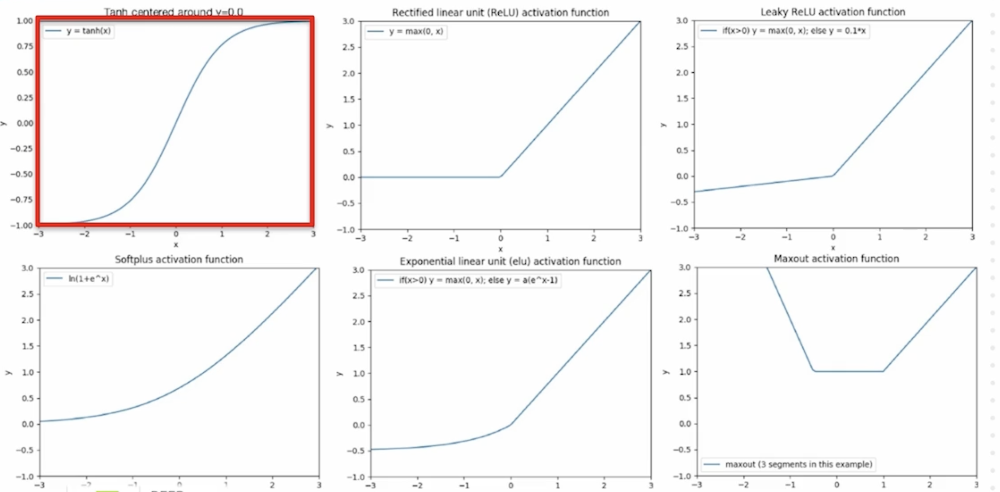

The upper middle chart shows the function for the rectified linear unit, also known as the ReLU neuron. We can see that it saturates on one side, but not on the other. If we compare it to the tanh and the sigmoid neurons, we see that it's somewhat different. The sigmoid and tanh with smooth *functions* and had its derivative defined in all points. Real U has a kink in the curve, which means that technically, its derivative is undefined in one point. In practice, this is not a problem. We can define the derivative as zero in that point. The key thing here is to avoid **curves that have discontinuities**. The benefit with a ReLU function is that it's very simple to compute. **If the weighted sum is negative, the output is zero. If the weighted sum is positive, the output equals the weighted sum.**

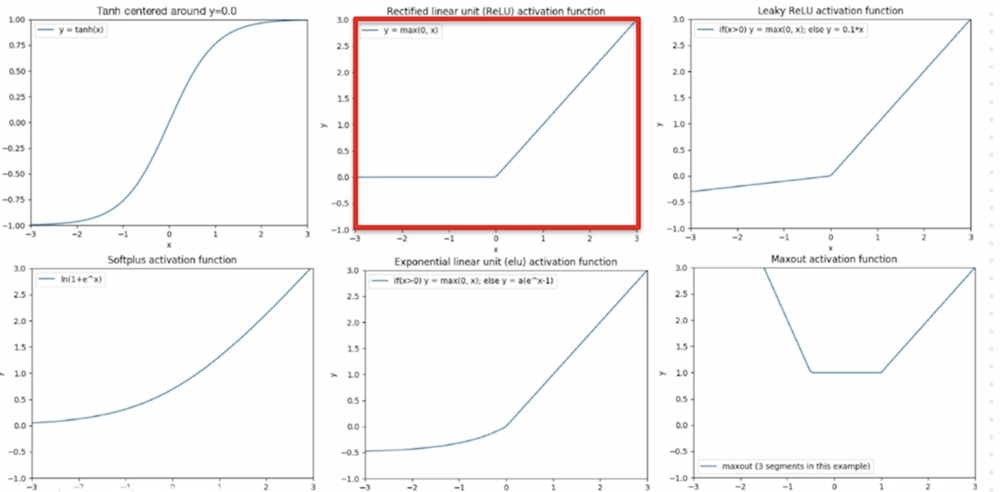

The upper right chart shows the leaky ReLU unit. This addresses the issue that the ReLU function is saturated on one of the sides.

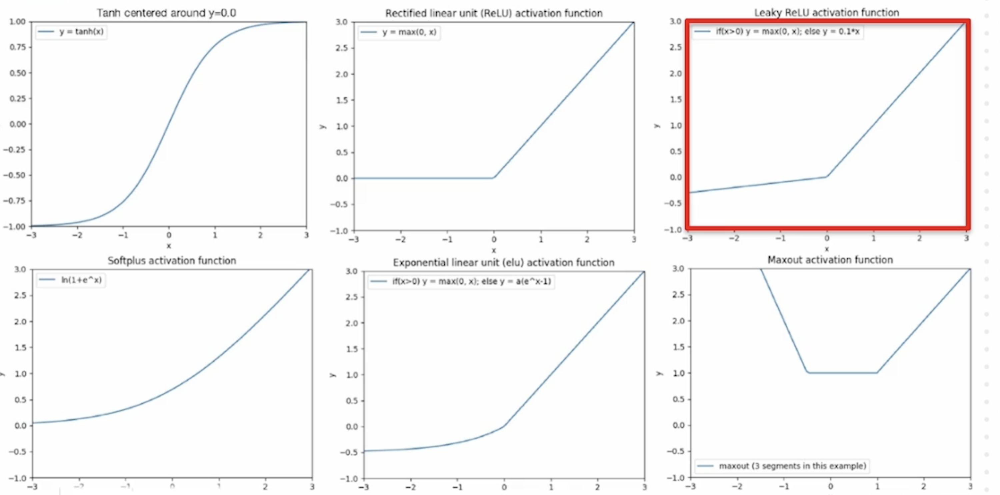

Let's move on to the lower left, which is known as the Softplus function. It is similar to the ReLU neuron, but it's smooth rather than having a kink in the curve.

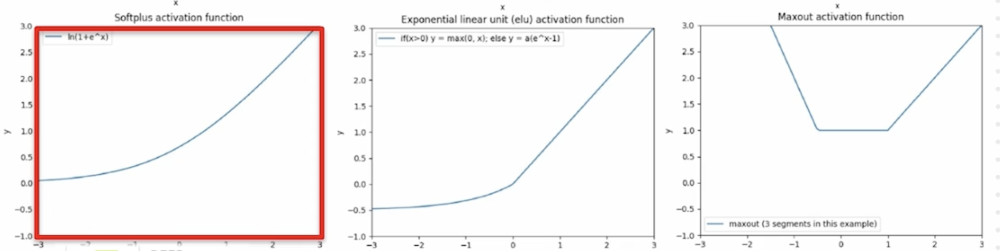

Moving on to the exponential linear unit, or elu unit. This is similar to leaky ReLU, but it's, again, smooth rather than having the kink in the curve.

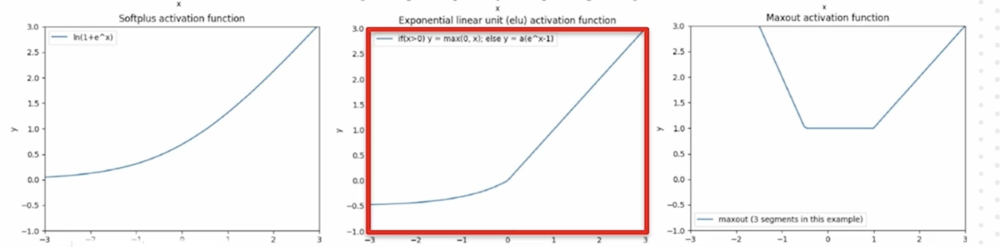

Finally, to the so-called maxout function. This is a generalization to the ReLU function, but it has multiple line segments. In the example in the figure, we have three segments, but we can make a maxout unit with more segments if needed.

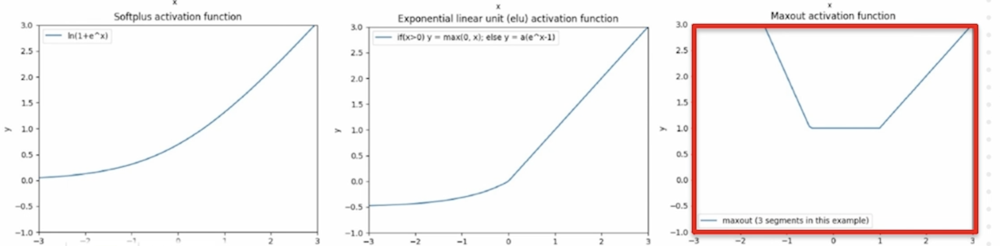

#Now the question is, which activation function should we pick?



And as always, this is a design choice that we will have to experiment with. As a rule of thumb, **you can start with a ReLU unit because it's so simple**, and then check the behavior with that and compare it to the behavior with other functions and settle on something that works well for your use case.


Let's now summarize all of these techniques that we have presented in the previous and this video.


You will want to normalize your inputs. This will keep the weighted sum small and reduce the risk for saturated neurons in the input layer. You can apply batch normalization. This is like input normalization, but will be used for the hidden layers.


You should pick a suitable weight initialization scheme. This will keep initial weighted sums small. If you use a sigmoid neuron in the output layer, you should use the cross-entropy loss function. This will ensure that the gradient will propagate, even if you have a saturated output neuron.

Finally, you can choose to use a different activation function to avoid the saturation problem altogether.

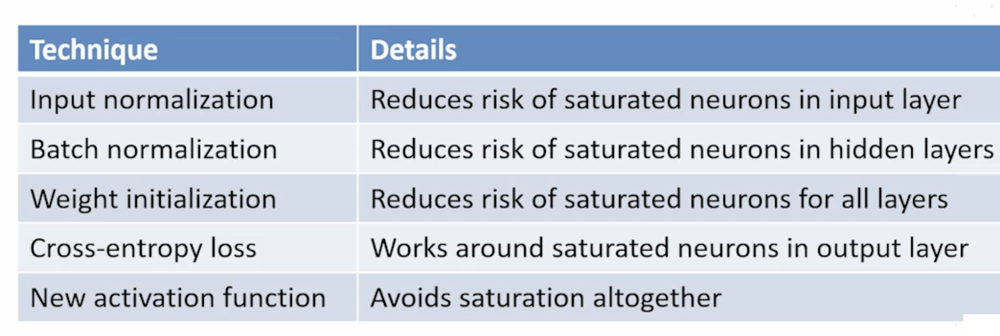